In [91]:
import numpy as np
import cv2 as cv2
from pathlib import Path
from matplotlib import pyplot as plt
from skimage.filters import sobel_h,sobel_v 
import glob
from skimage.measure import block_reduce

In [92]:
base_dir = Path().absolute().parent
data_path = base_dir / "data/raw"
img_path = data_path / "test_board_image.jpg"

In [93]:
img_path

WindowsPath('c:/Users/ANOOP/Desktop/Python/ai-porfolio/otb-chess-vision/data/raw/test_board_image.jpg')

In [94]:
image = cv2.imread(str(img_path))
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

In [95]:
gray.shape

(1699, 2611)

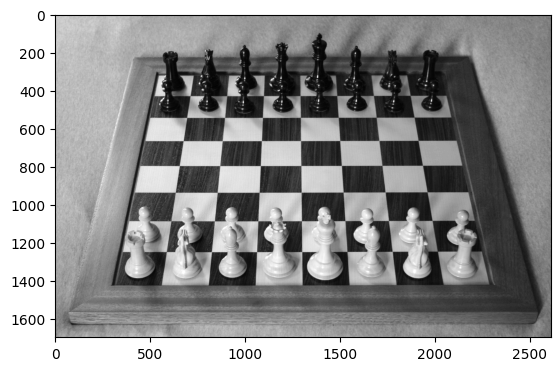

In [96]:
plt.imshow(gray,cmap="gray")

In [97]:
image_c = gray.copy()

In [98]:
# Get the edges from the image
wide_edges = cv2.Canny(image_c,50,255)
tight_edges = cv2.Canny(image_c,200,225)
custom_edges = cv2.Canny(image_c,100,200)

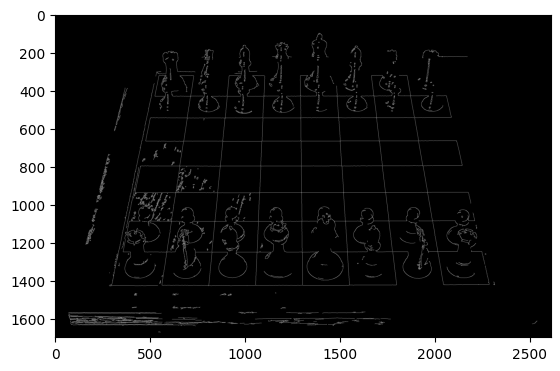

In [99]:
plt.imshow(wide_edges,cmap="gray")

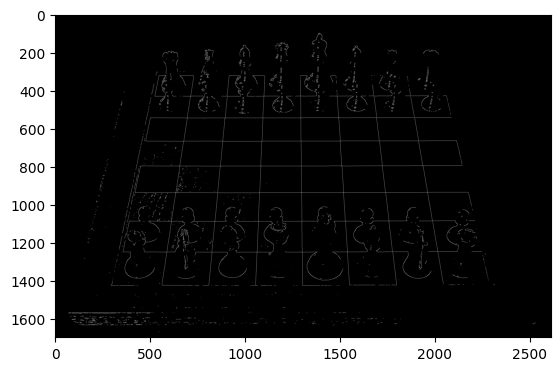

In [100]:
plt.imshow(tight_edges,cmap="gray")

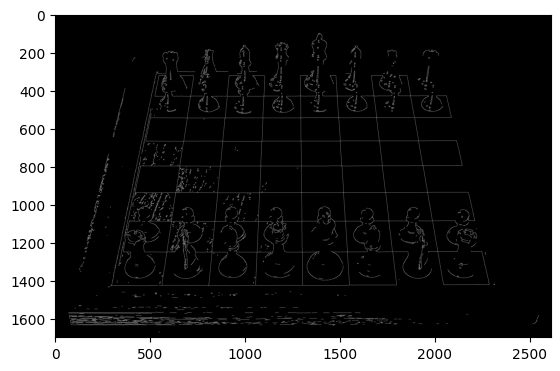

In [101]:
plt.imshow(custom_edges,cmap="gray")

In [102]:
hor_edges = sobel_h(image_c)
ver_edges = sobel_v(image_c)

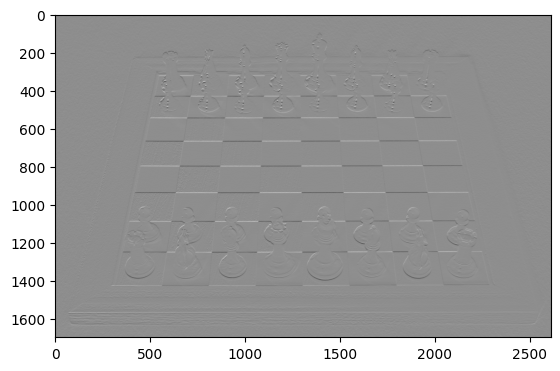

In [103]:
plt.imshow(hor_edges,cmap="gray")

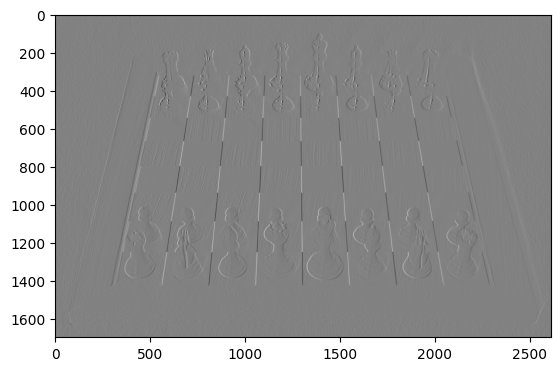

In [104]:
plt.imshow(ver_edges,cmap="gray")

In [105]:
test_h_v = ver_edges + hor_edges

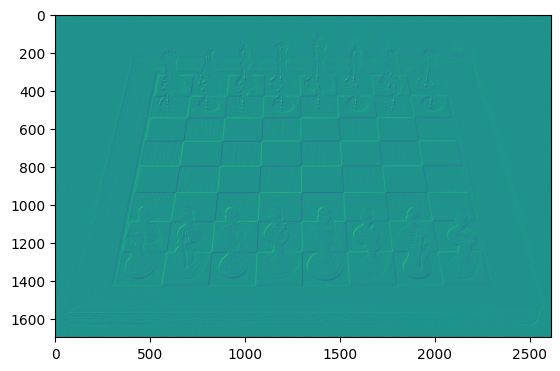

In [106]:
plt.imshow(test_h_v)

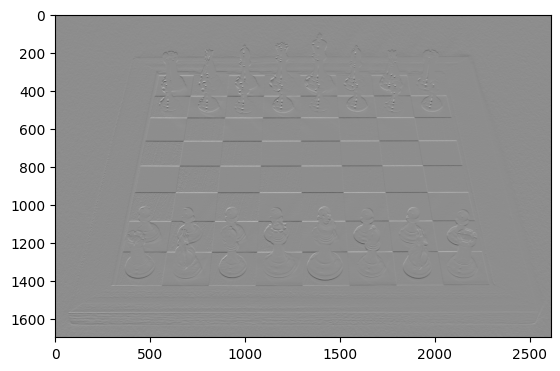

In [107]:
hor_edge_min = hor_edges.min()
hor_edge_max = hor_edges.max()
hor_edges_rescaled = ((hor_edges - hor_edge_min) / (hor_edge_max-hor_edge_min)) * 255
hor_edges_rescaled = hor_edges_rescaled.astype(np.uint8)
plt.imshow(hor_edges_rescaled,cmap="gray")

In [108]:
lines = cv2.HoughLines(hor_edges_rescaled,1,np.pi/90,100)


In [109]:
len(lines)

3720

In [110]:
lines.shape


(3720, 1, 2)

In [111]:
test_c = hor_edges_rescaled.copy()

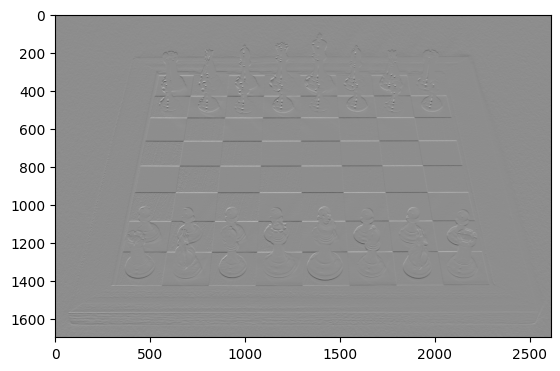

In [112]:
plt.imshow(test_c,cmap="gray")

In [113]:
for line in lines:
    rho,theta =  line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(test_c, (x1, y1), (x2, y2), (0, 0, 255), 2)

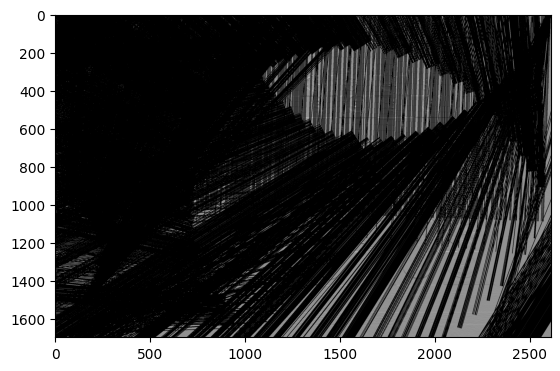

In [114]:
plt.imshow(test_c,cmap="gray")

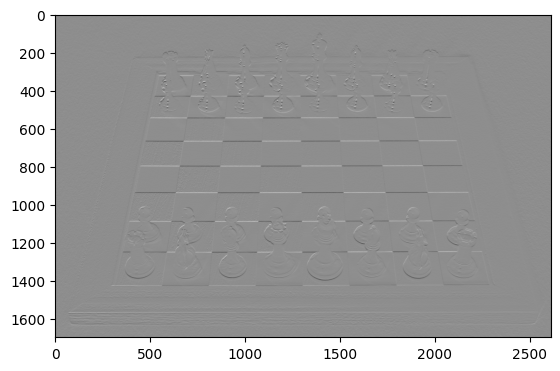

In [115]:
plt.imshow(hor_edges,cmap="gray")

In [116]:
hor_detect = cv2.Canny(hor_edges_rescaled,50,200,apertureSize=3)

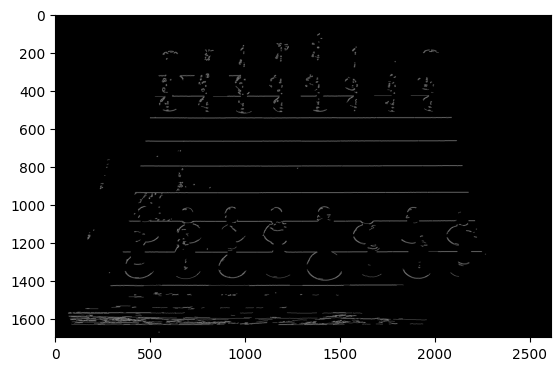

In [117]:
plt.imshow(hor_detect,cmap="gray")

In [118]:
lines = cv2.HoughLines(hor_detect ,1,np.pi/180,300)

In [119]:
len(lines)

43

In [120]:
test_hor_1 = hor_detect.copy()

In [121]:
for line in lines:
    rho,theta =  line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(test_hor_1, (x1, y1), (x2, y2), (255, 0,0), 4)

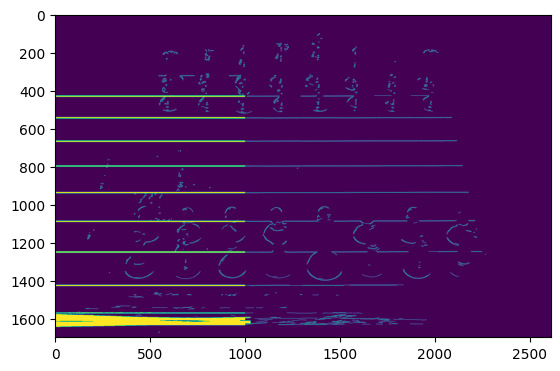

In [122]:
plt.imshow(test_hor_1)

In [123]:
def load_images(path:Path,count):
    print(f"Looking for images in {str(path)}")
    images=[]
    grays=[]
    for i,img_path in enumerate(path.glob('*.jpg')):
        if i == (count - 1):
            break
        else :
            img = cv2.imread(str(img_path))
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
            images.append(img)
            grays.append(gray)
    print("Image loading done")
    return images,grays

In [124]:
def rescale_image(img:np.array):
    min_value = img.min()
    max_value = img.max()
    rescaled_img = ((img-min_value)/(max_value-min_value))*255
    rescaled_img = rescaled_img.astype(np.uint8)
    return rescaled_img

In [125]:
def get_features(img):
    print("Feature extraction started")
    ver_features = sobel_v(img)
    ver_features = rescale_image(ver_features)
    hor_features = sobel_h(img)
    hor_features = rescale_image(hor_features)
    print("Feature extraction completed")
    return ver_features,hor_features

In [126]:
def display_img(img_list:list,color="gray"):
    for img in img_list:
        plt.imshow(img,cmap=color)
        plt.show()

In [127]:
def auto_canny(img:np.array,sigma=0.33):
    print("Edge extraction started")
    median = np.median(img)
    lower_bound = int(max(0,(1.0 - sigma)*median))
    upper_bound = int(max(0,(1.0 + sigma)*median))
    img_edges = cv2.Canny(img,lower_bound,upper_bound)
    return img_edges

In [128]:
def draw_lines(img:np.array,lines):
    img_c = img.copy()
    if lines is not None:
        print(f"Number of lines extracted{len(lines)}")
        for line in lines:
            x1,y1,x2,y2,=line
            pt1 = (int(x1), int(y1))
            pt2 = (int(x2), int(y2))
            cv2.line(img_c, pt1, pt2, (255,0,0), 3)
    return img_c
    

In [129]:
# # Rho Theta approach
# def draw_lines(img:np.array,lines):
#     img_c = img.copy()
#     if lines is not None:
#         print(f"Number of lines extracted{len(lines)}")
#         for i in range(0, len(lines)):
#             rho = lines[i][0][0]
#             theta = lines[i][0][1]
#             a = np.cos(theta)
#             b = np.sin(theta)
#             x0 = a * rho
#             y0 = b * rho
#             pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
#             pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
#             cv2.line(img_c, pt1, pt2, (0,0,255), 3)
#     return img_c
    

In [219]:
def reduce_lines(lines,img_shape):
    # Apply the length thershold
    length_threshold = np.max(img_shape) * 0.025
    long_lines = np.squeeze(np.where(lines[-2]>length_threshold))
    return lines[:,long_lines]

In [220]:
def get_line_properties(lines,img_shape):
    if lines is not None:
        print("Extraction of line properties started")
        x1=lines[:,0]
        y1=lines[:,1]
        x2=lines[:,2]
        y2=lines[:,3]
        p1 = np.array([x1,y1])
        p2 = np.array([x2,y2])
        print(p1.shape,p2.shape)
        # Euclidean Distance
        square=np.square(p2-p1)
        dist = np.sqrt(square[0]+square[1])
        print(dist)
        # Calculate the slopes of the line
        slope = np.divide((y2-y1),(x2-x1),where=(x2-x1)!=0)
        print(slope)
        line_properties = np.array([x1,y1,x2,y2,dist,slope])
        line_properties = np.squeeze(reduce_lines(line_properties,img_shape=img_shape))
    return line_properties
        
        

In [211]:
def extract_lines(edge_img,img,threshold=0.05):
    print("Line proposal started")
    threshold_pixels = np.max(edge_img.shape)*threshold
    #lines = cv2.HoughLines(edge_img, 1, np.pi/180, 150)
    lsd = cv2.createLineSegmentDetector()
    lsd_segments = lsd.detect(edge_img)
    lines = np.squeeze(lsd_segments[0])
    lines_prop = get_line_properties(lines,img.shape)
    print(f"lines_prop{len(lines_prop)} shape : {lines_prop.shape}")
    lines=lines_prop[0:4,:].T
    print(f"Length of line segments ===== {len(lines)}, shape {lines.shape}")
    image_lines = draw_lines(img,lines)
    return image_lines
    

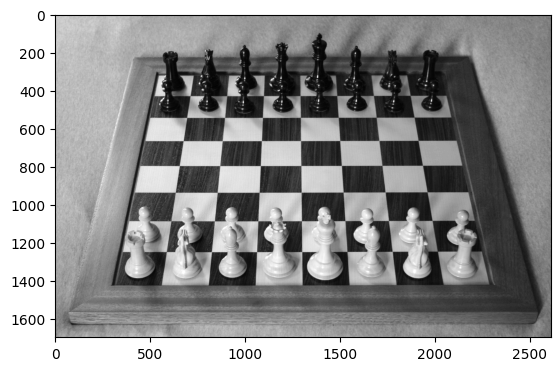

In [133]:
plt.imshow(gray,cmap="gray")

In [134]:
imgs,gray_imgs = load_images(data_path,6)

Looking for images in c:\Users\ANOOP\Desktop\Python\ai-porfolio\otb-chess-vision\data\raw
Image loading done


In [135]:
len(imgs),len(gray_imgs)


(5, 5)

Initial Image


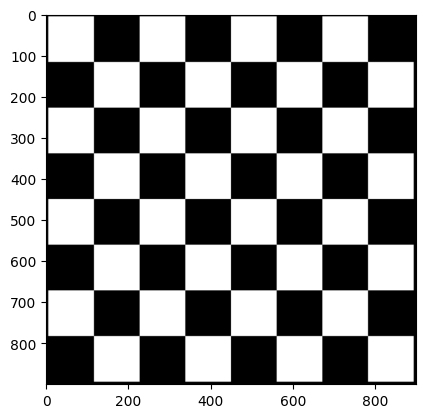

Blurred Image
Feature extraction started
Feature extraction completed


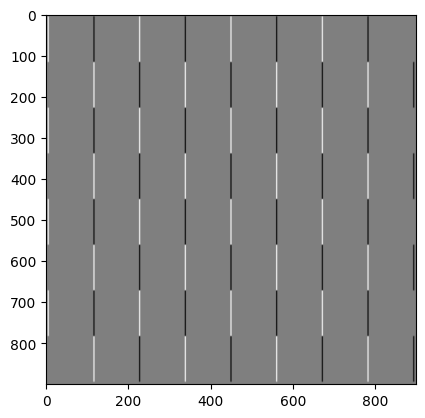

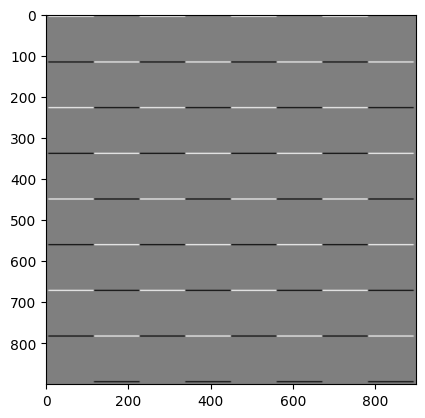

Edge extraction started
Edge extraction started
Edges dsiplay:----


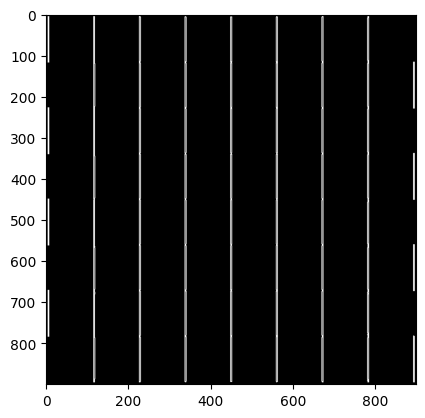

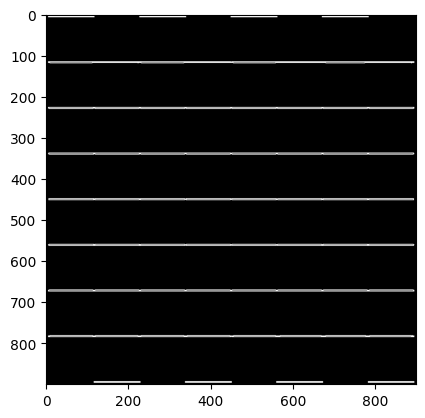

Vertical Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 162) (2, 162)
[888.7501    888.75        9.308586  223.75099   112.50321   105.00001
  65.02508   217.51389    81.25003   338.7501     81.25003    76.25
  57.501125  111.25      888.75006   888.75      886.25       46.28509
 112.499985   21.25      105.        112.49997    26.34966    45.037487
  25.057283   31.25      111.25      103.75       80.         32.521988
 100.000565   80.00236     7.6827154 555.00037   331.25      106.25064
 327.5       108.74988   886.25      555.00024   113.75205   442.50024
 770.        442.5001    886.25      330.        111.250435  112.50008
 112.50009   112.49999   112.49999   112.5       112.5       111.25
 111.25      111.25      112.5       111.25      103.75      103.75
 102.5       102.5       102.5       102.5       102.5       102.5
 102.5       102.5       102.5       102.5       102.5       102.5
 103.75      103.

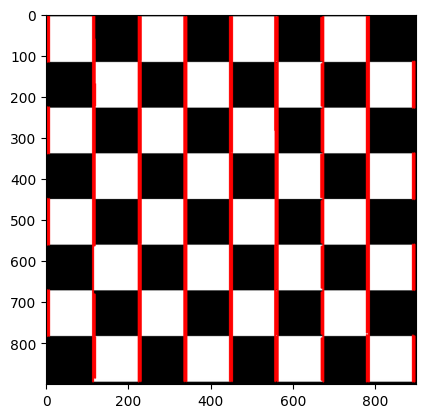

Horizontal Line Estimations =======================================
Line proposal started
Extraction of line properties started
(2, 156) (2, 156)
[888.7501    888.75      332.50018   442.50064    42.53323   662.5021
 105.00001    65.02508    81.25003    81.25003    57.501125  111.25
 112.499985  112.49997   111.25      171.28033   888.75      886.25
  46.28509    21.25      105.         26.34966    45.037487   31.25
  80.        105.        888.75006     6.2963347 555.00037   331.25
 106.25064   555.00037   886.25      668.7499     95.00048   330.
 886.25       58.782383   65.01299   886.25      111.25043   112.50006
 112.50009   111.25      112.49999   112.5       111.25      111.25
 112.49999   112.5       111.25      111.25      103.75      102.5
 102.5       102.5       102.5       102.5       102.5       103.75
 103.75      102.5       102.5       102.5       102.5       102.5
 102.5       103.75      103.75      102.5       102.5       102.5
 102.5       102.5       102.5       1

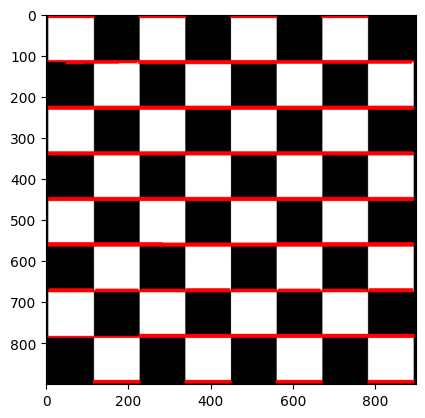

Initial Image


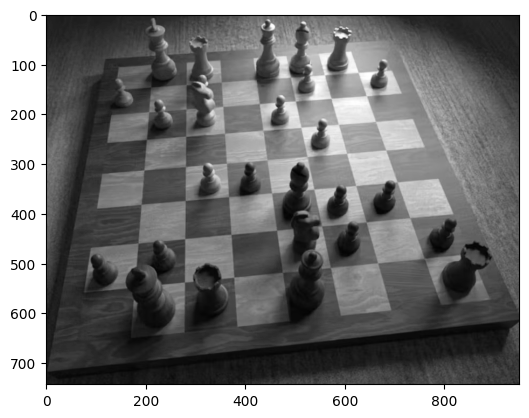

Blurred Image
Feature extraction started
Feature extraction completed


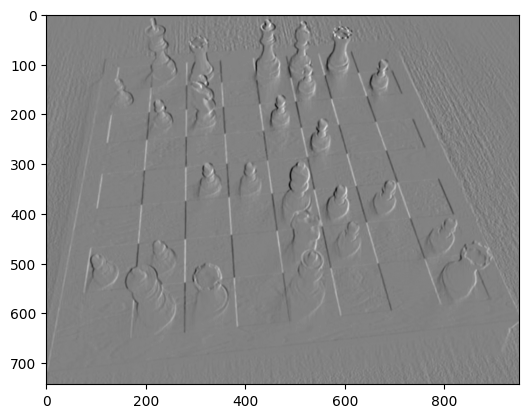

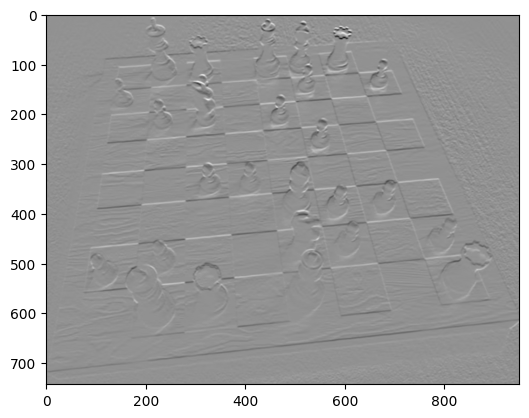

Edge extraction started
Edge extraction started
Edges dsiplay:----


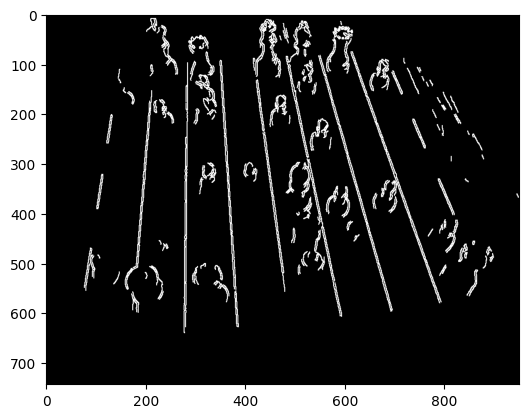

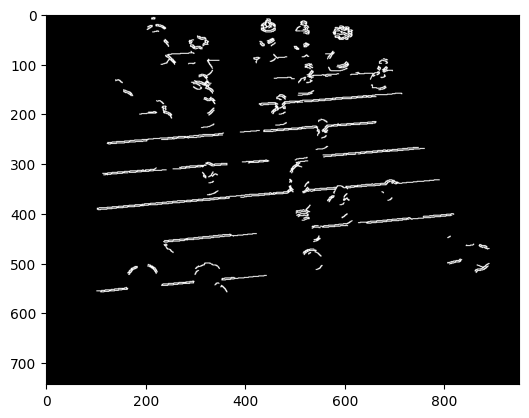

Vertical Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 648) (2, 648)
[202.51358   147.91399     8.796733  189.23846   101.2522    154.46104
  23.771803   21.321327  139.18173    56.356544   43.882427   69.472946
  15.128111   10.055737   83.10369    69.221725   68.92505    11.764749
  12.744935   10.922632   26.920914   59.101654   13.938232    7.8353825
  20.00483    78.469925   27.411228    9.06462     3.7587614  10.015958
  10.0108385  48.27379    62.51247     8.774477   46.25343   139.20412
 177.84248   262.35995    17.517794  110.588554   33.16856    11.286442
  11.317198   11.673502  164.88626     7.561697    9.072618   16.664793
  17.67943    21.281782   12.0253525  22.785648   17.880611    7.834561
  10.240858  172.03358    17.352488   47.316624   33.21248     7.7397118
  25.494755   48.91055    13.043278  100.97062    13.348498   98.55778
  42.870377   29.046005   52.540936   95.64019   101.10624    4

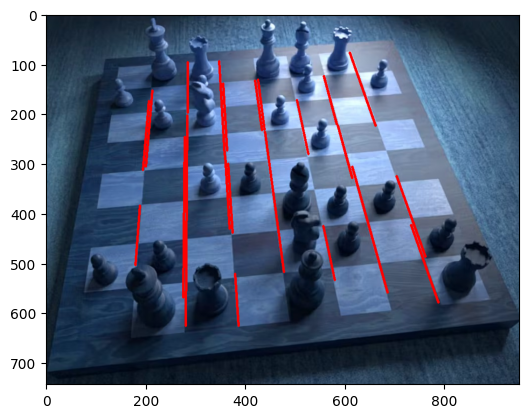

Horizontal Line Estimations =======================================
Line proposal started
Extraction of line properties started
(2, 400) (2, 400)
[ 31.552197   51.386894   60.46016     7.5365076  11.849039   20.020054
  51.603313   47.756115   13.8155985  40.445786   42.779617   60.311104
 120.501396  133.07675    17.871979    6.3900504  11.511553   59.06958
  52.981567  131.9675      8.809187    6.2733703  59.03422    22.868666
  50.140354   13.050351   41.408432  104.222496   81.696236   17.813847
  15.013934   75.16388    19.650917   15.757337    6.728214   11.855293
  20.30291     7.9196067   7.904544    9.07908    32.8145      7.5098886
  80.44656    55.32364    17.727873   21.39026    62.887733   52.63135
  10.003458   25.141169  141.8018     82.83917    22.775782   10.003145
  71.75085    16.75521    61.910793   64.053986   11.79134    39.00675
   8.876877   26.421982   29.104607  102.68146    40.256676    8.778906
  65.37884    19.033726   44.13882    27.890676   61.356266   78

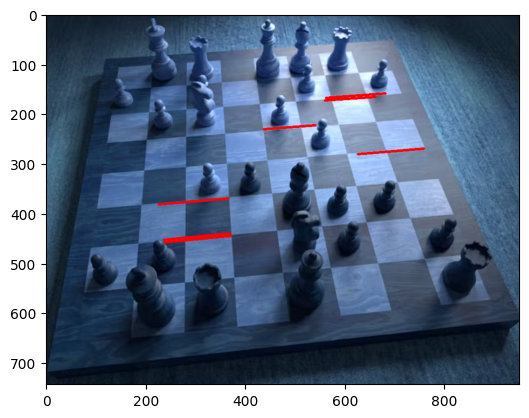

Initial Image


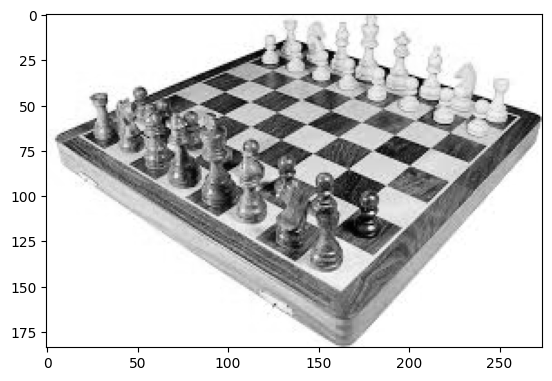

Blurred Image
Feature extraction started
Feature extraction completed


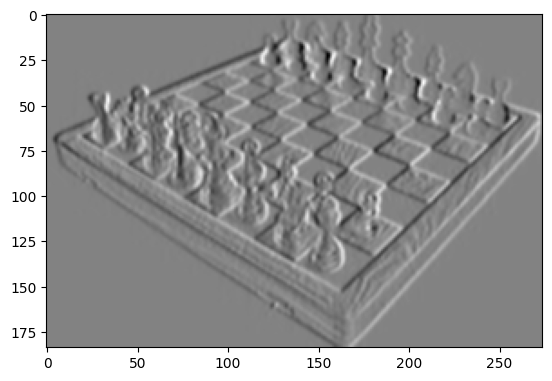

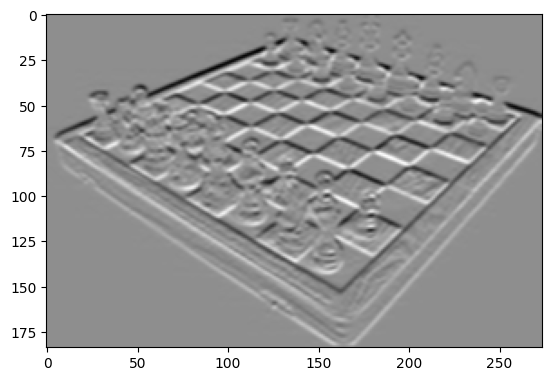

Edge extraction started
Edge extraction started
Edges dsiplay:----


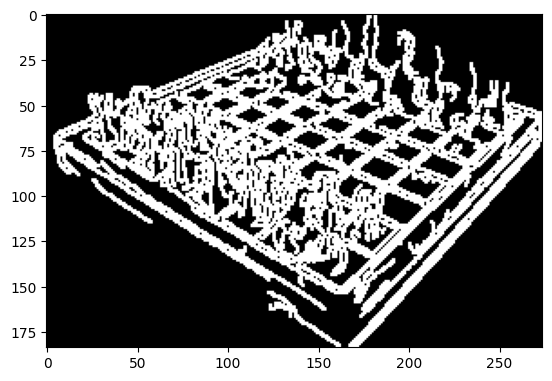

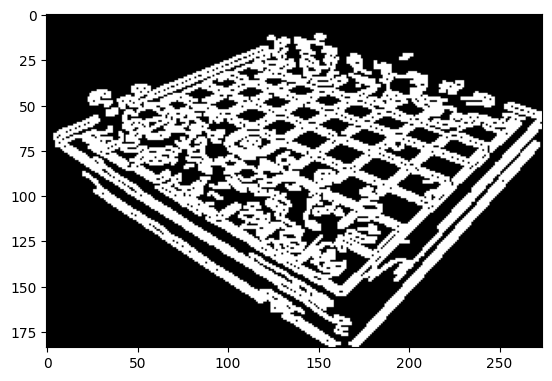

Vertical Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 248) (2, 248)
[  7.5290837   7.7152042  13.784663   12.555015   13.786202   16.665846
   7.878546   13.975184   67.87686     7.1813407  10.076734   19.035372
  15.810961   13.743731   15.559478   11.827031    6.6576657  15.102082
  15.194598    6.9607506   7.7448716   9.323692    6.6349607   7.239326
   8.947898   17.869926    7.635596    8.292122   13.795343   16.611305
  12.306828   17.34149    13.958932   18.026539    7.896472    7.60282
   9.488231   11.133773   32.427288   10.679104    7.6014605  11.85728
  13.974021    7.08392     6.3628287  10.472704   11.850765    5.5004344
   7.980755    6.6726556   8.262867    7.558272   19.080408    6.723287
  24.622128    7.756347   48.748886    6.360575   10.674736   15.20444
   8.365042  148.57196    12.3070755  10.679874    9.780702    6.7186356
   8.859149   11.523871    6.25743    13.414758    9.519607    

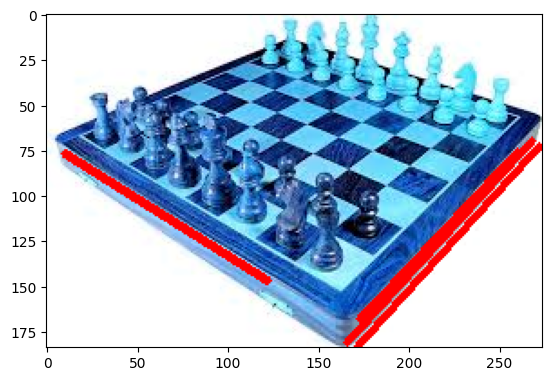

Horizontal Line Estimations =======================================
Line proposal started
Extraction of line properties started
(2, 233) (2, 233)
[  6.3410854   7.7941704   6.9293165   7.5947075   6.088303    6.2296543
   9.098092   13.460923    9.695258    7.503886   12.557503    8.730769
  19.037968    6.6766567   5.          7.570633   10.679995   14.238631
  16.24266    10.275663   23.572279    8.781091    6.3361278  10.074901
   5.4641895   7.1852093   9.482282   12.722517   11.835345    4.999494
   6.2889686   8.090566   13.432221   10.287187    9.74091    17.187641
   5.2971873  16.63611    24.615429    7.2188687   6.700422    9.984928
   6.7228827   6.373661   12.54966    17.840979    6.2392297  13.461279
   9.607506   49.213223   15.800895   16.993183   15.016283   79.50488
  16.99775    10.268075   13.462356    6.3690567 110.940575   29.562828
   6.185208   14.628362   12.747385   10.076364  148.57219    95.68621
 145.74658   105.047615    7.3814764   8.375091   13.047073    

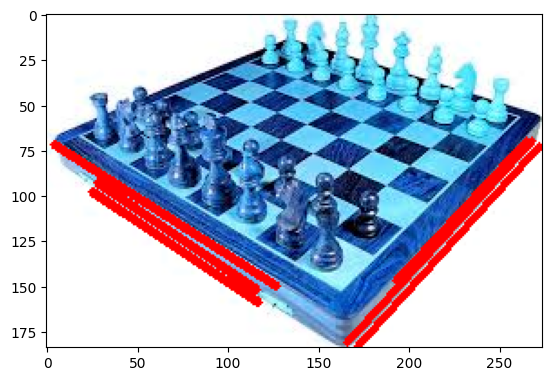

Initial Image


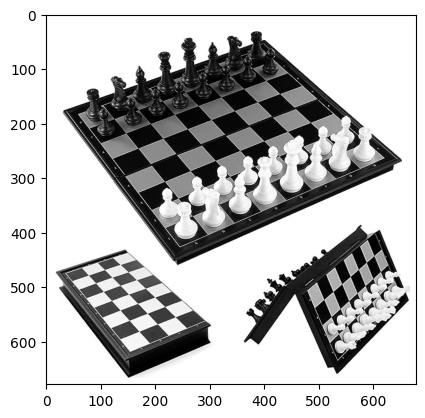

Blurred Image
Feature extraction started
Feature extraction completed


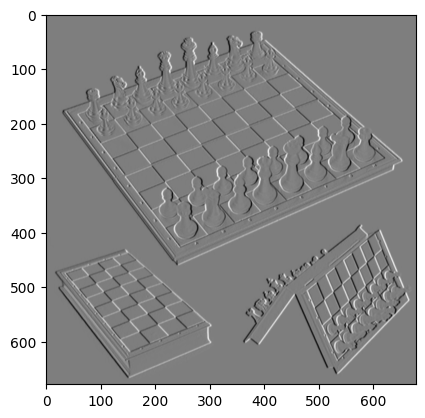

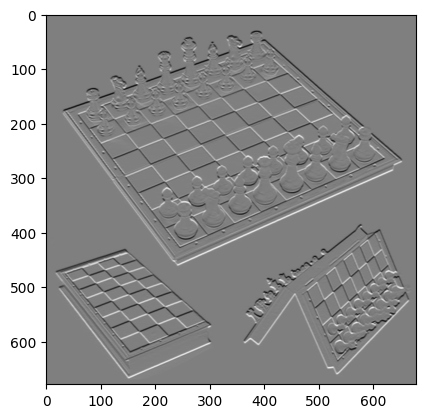

Edge extraction started
Edge extraction started
Edges dsiplay:----


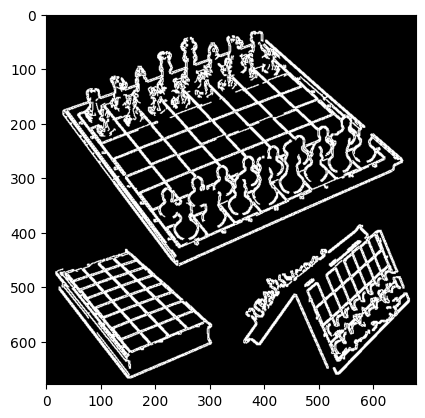

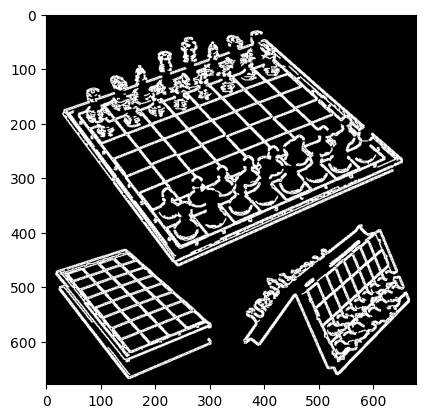

Vertical Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 1225) (2, 1225)
[11.301549   7.5016727 10.204713  ... 10.569849  15.0469885  6.598321 ]
[-1.8246941e+01 -1.4897864e+03  9.6310883e+00 ... -8.4594673e-01
  1.1851373e+00  1.8331453e-01]
lines_prop6 shape : (6, 19)
Length of line segments ===== 19, shape (19, 4)
Number of lines extracted19


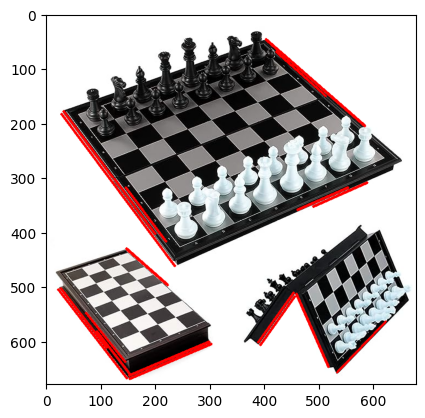

Horizontal Line Estimations =======================================
Line proposal started
Extraction of line properties started
(2, 1184) (2, 1184)
[ 6.3423715 17.84332   18.420101  ... 12.29892   24.99934    7.601508 ]
[25.727205    0.13422595 -0.21385224 ...  1.2495856   1.3132712
  0.14363065]
lines_prop6 shape : (6, 24)
Length of line segments ===== 24, shape (24, 4)
Number of lines extracted24


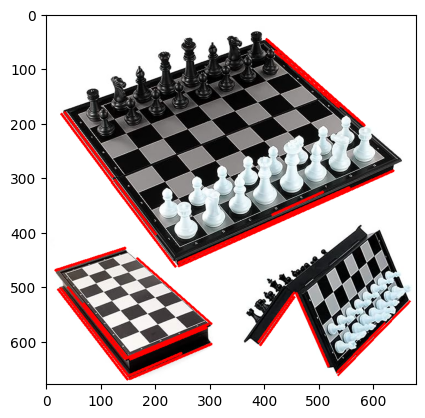

Initial Image


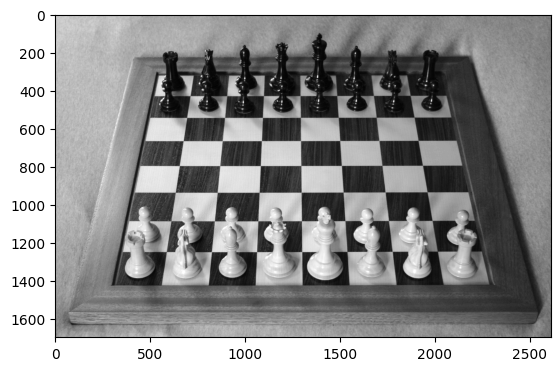

Blurred Image
Feature extraction started
Feature extraction completed


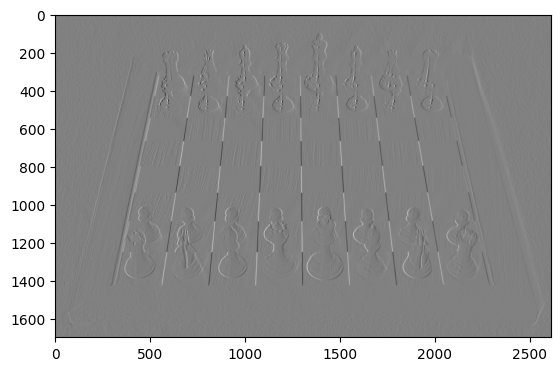

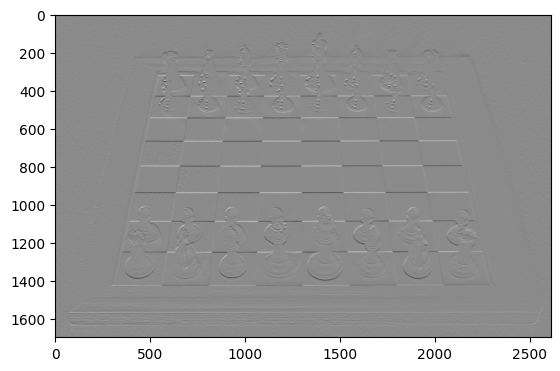

Edge extraction started
Edge extraction started
Edges dsiplay:----


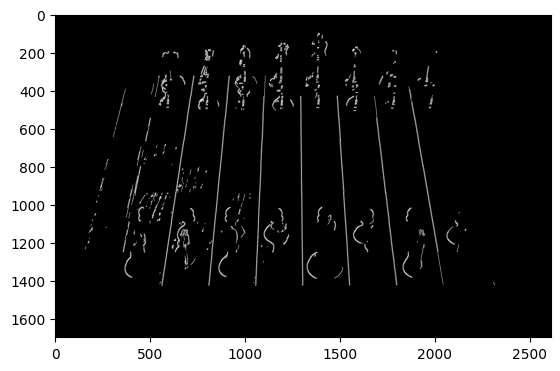

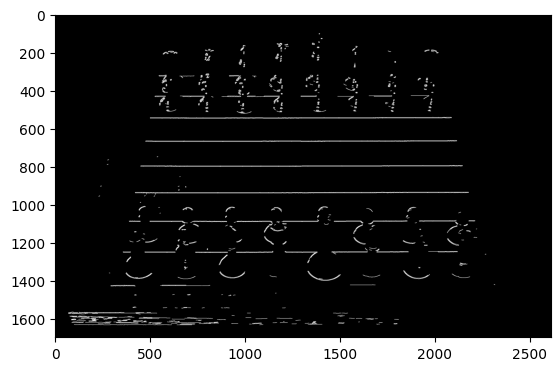

Vertical Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 1205) (2, 1205)
[ 7.7321196 10.021941  82.70374   ...  5.        21.396458  23.781363 ]
[ -0.11227878  -2.2771425  -21.031279   ...   0.          -8.578939
 -15.651304  ]
lines_prop6 shape : (6, 57)
Length of line segments ===== 57, shape (57, 4)
Number of lines extracted57


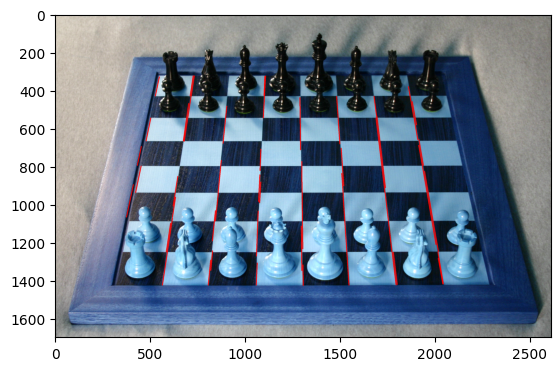

Horizontal Line Estimations =======================================
Line proposal started
Extraction of line properties started
(2, 1122) (2, 1122)
[ 773.76     161.26804 1097.5056  ...   51.25      25.        27.5    ]
[-0.00252918 -0.00546216 -0.00221739 ...  0.         -0.
 -0.        ]
lines_prop6 shape : (6, 104)
Length of line segments ===== 104, shape (104, 4)
Number of lines extracted104


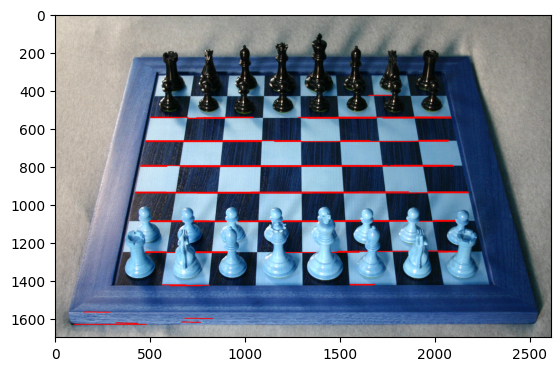

In [136]:
for i,gray_img in enumerate(gray_imgs):
    print("Initial Image")
    display_img([gray_img])
    print("Blurred Image")
    blurred = cv2.GaussianBlur(gray_img, (3, 3), 0)
    ver_features,hor_features = get_features(blurred)
    display_img([ver_features,hor_features])
    ver_edges = auto_canny(ver_features)
    hor_edges = auto_canny(hor_features)
    ##########################################
    kernel = np.ones((2,2),np.uint8)
    ver_edges = cv2.dilate(ver_edges,kernel,iterations=1)
    hor_edges = cv2.dilate(hor_edges,kernel,iterations=1)
    #####################################
    print("Edges dsiplay:----")
    display_img([ver_edges,hor_edges])
    print("Vertical Line Estimations |||||||||||||||||||||||||||||||||||||||||")
    ver_line_img = extract_lines(ver_edges,imgs[i])
    display_img([ver_line_img])
    print("Horizontal Line Estimations =======================================")
    hor_line_img = extract_lines(hor_edges,imgs[i])
    display_img([hor_line_img])
    
    

In [137]:
hor_features.shape

(1699, 2611)

Initial Image


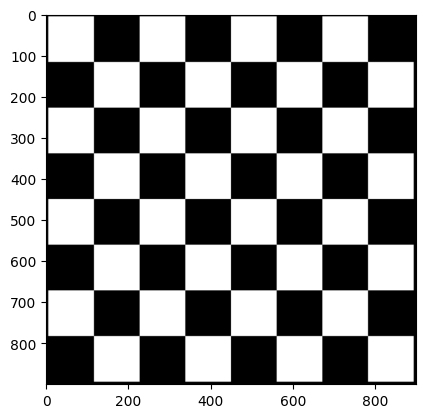

Blurred Image
Edge extraction started
Edges dsiplay:----


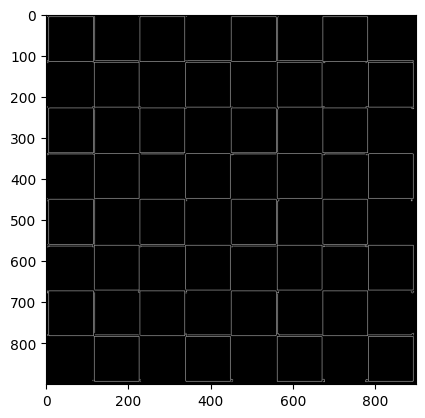

Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 316) (2, 316)
[ 57.536865  108.75003     5.0227833 107.500565  110.00034   106.250725
 107.500565  107.50088   106.25      107.500755  102.5       107.50034
 105.        105.        107.500015  108.74994   107.5       107.5
  97.50031   106.250755  107.5       103.75      106.25      105.000626
 107.50001   102.50009   107.5       103.750244  107.49995   107.50001
 107.500305  103.75023   106.2507    103.75      102.5       103.75017
 103.75023   105.00009   103.750244  106.25      105.00041   102.5
 105.000244  103.75039   103.75031    93.75      102.5       103.75
 103.75012   111.25146    63.805557  103.750305  115.00648   103.75
 108.7502    102.5       108.75023   108.75006   105.00006   108.74997
 108.75003   107.50121   108.75131   107.500305  102.50012   105.
  28.852875  107.50003   107.50256   107.500496  106.25      108.75
 106.25028   106.25009   103.75

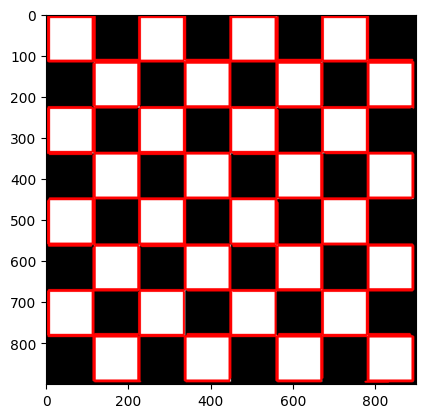

Initial Image


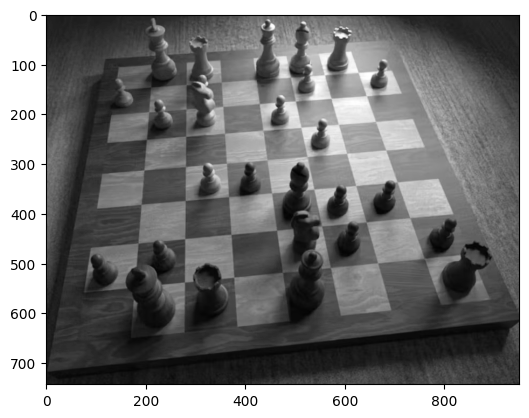

Blurred Image
Edge extraction started
Edges dsiplay:----


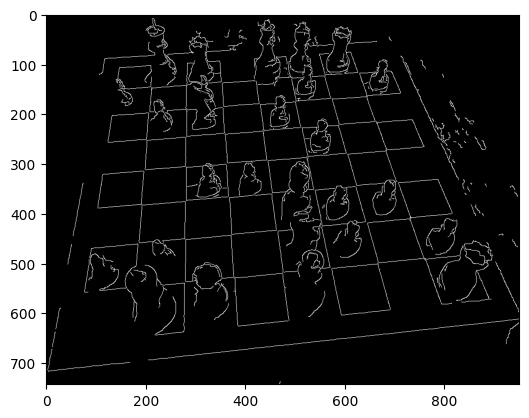

Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 940) (2, 940)
[ 10.629099    9.260444   24.642784   41.411037   91.46234     8.812217
  25.463549    8.001393   12.6814     23.351946    9.033684    9.3716135
  21.236383   26.746021   12.373554    7.9893413  11.130727   12.453087
   8.964186   50.24437    19.699263   18.015268   22.53393    15.07735
  54.57097    14.138652   16.977625   13.287628   10.616577    7.943994
  19.519203    9.756938    9.748662   13.485878   17.9925     13.264345
  23.988787    8.836428   14.628284   10.689594    9.01385    14.562211
  23.90383    13.28759     8.858398   17.765285   38.046783   10.646039
  22.36027     8.830096    9.752598   14.026505   17.677656   10.477251
  22.074024   76.50246    16.996693    9.959219    8.837505   18.679342
  12.423609   11.146633    9.026453   54.32826    15.068582   12.787558
   8.795696   34.07147    57.54693    57.11793     8.85693     9.501593

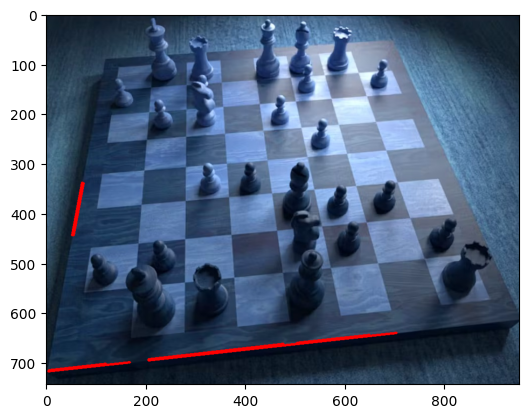

Initial Image


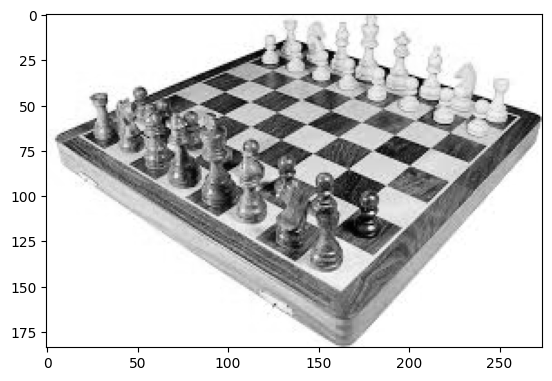

Blurred Image
Edge extraction started
Edges dsiplay:----


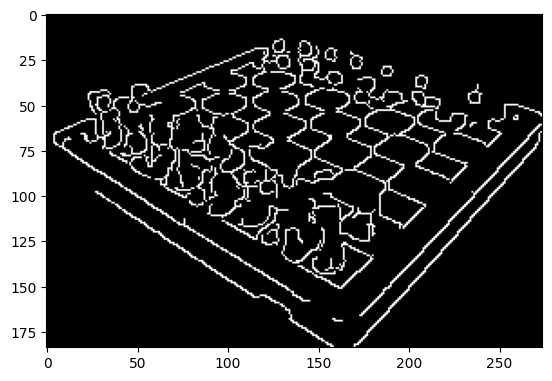

Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 183) (2, 183)
[  7.177781   12.818696    9.013869   21.240028   25.703856    7.9986043
  53.01221   151.35294   144.19705   149.5877     11.495746   17.802675
  82.165855    6.229664    9.742482   20.800537   10.679087  106.081245
   7.8476954  10.661809   16.767107   10.647774    6.7235727   8.208048
   7.5272875  21.829636   18.192034   12.56138     6.2353406  74.87939
   7.850918   79.76318    64.47061    11.288359   16.21827     7.991111
  34.116047   89.260826   11.5034075  10.071131   19.425192   25.647118
  15.220566   40.56185    15.258181   25.698944    7.285178    9.72512
  10.678812   10.582281   16.99037     8.837615   11.396272    8.381215
  12.310957   15.185094    9.100023   79.104935   12.562297    9.519323
  17.365465    7.5207806  10.30308    20.189821    7.840546   17.361753
  13.267813   10.752782   11.111942   11.805901    8.378037    8.815285


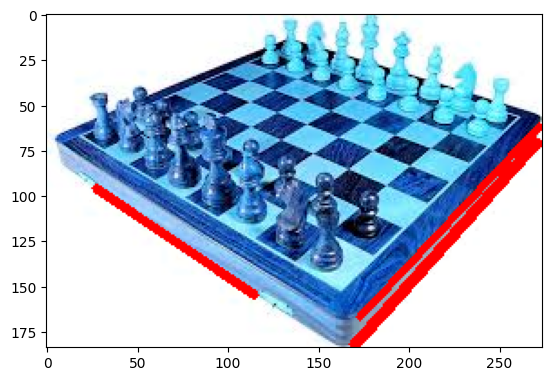

Initial Image


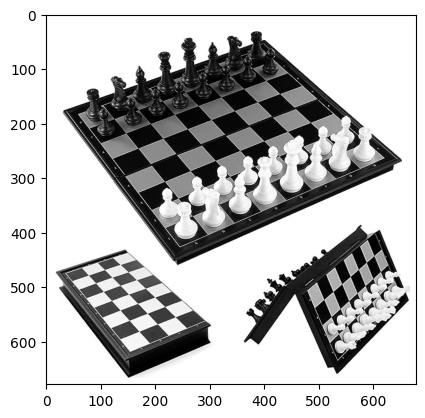

Blurred Image
Edge extraction started
Edges dsiplay:----


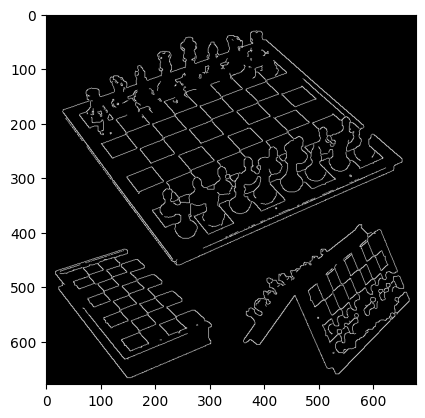

Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 906) (2, 906)
[ 41.213604   14.609916   30.078005   11.4056635  14.992515   48.742355
  29.69391    11.316921   16.78248    10.057884   14.117676   38.02356
  17.636677   11.392801   40.67279   236.4745    238.23837    32.799347
  28.283413   26.513025   35.39937    26.559387  102.77075    29.181273
  16.81518    37.499992   29.181475   33.63242    27.519415   30.013
  28.3281     28.321478   13.287403   28.467243   30.93177    31.01465
  30.096863   70.90911    32.710518   10.6054125  15.051715   13.022943
 108.514244   35.285244   16.816938   41.251614   39.784065   16.230867
 117.74979    39.25065    16.84985    64.02956     7.2166505  11.51149
  14.141382   31.531614    7.069509   19.52519    15.043225   13.447708
  15.902595   18.5636     17.671106   15.895178   18.580233   33.587273
  19.425503   21.244602  118.300934   15.901698   21.202513   19.45305
 136.1

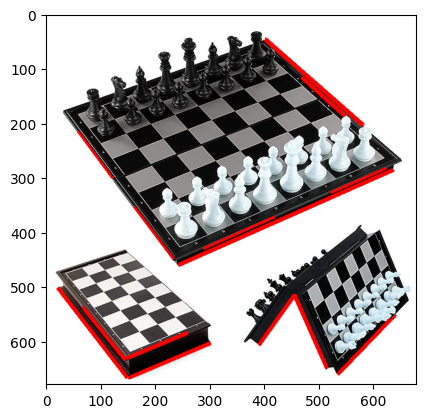

Initial Image


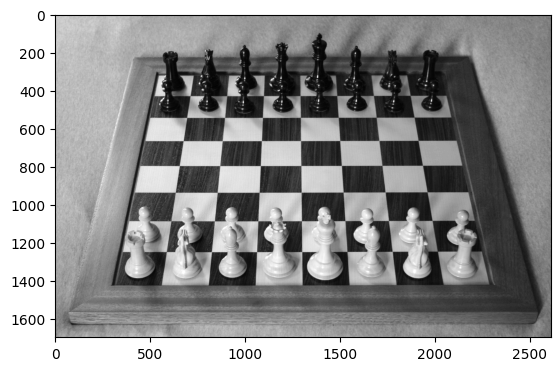

Blurred Image
Edge extraction started
Edges dsiplay:----


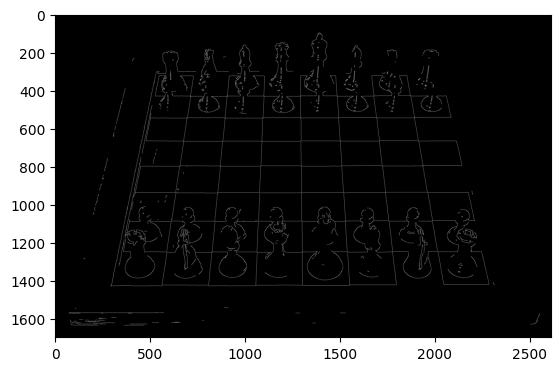

Line Estimations |||||||||||||||||||||||||||||||||||||||||
Line proposal started
Extraction of line properties started
(2, 1841) (2, 1841)
[16.42031  30.031372 12.066346 ... 67.50075  12.5      23.75    ]
[ 9.746003e+00 -7.312544e+01 -4.502817e+00 ... -5.786974e-04  0.000000e+00
  0.000000e+00]
lines_prop6 shape : (6, 180)
Length of line segments ===== 180, shape (180, 4)
Number of lines extracted180


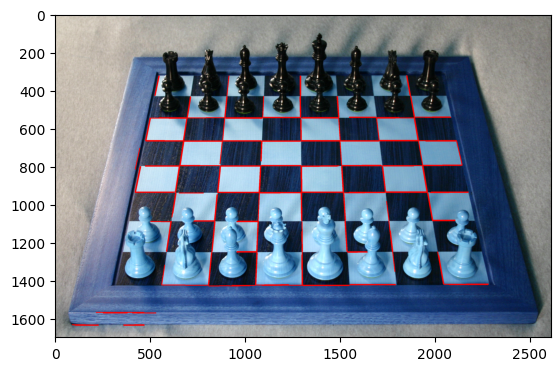

In [138]:
for i,gray_img in enumerate(gray_imgs):
    print("Initial Image")
    display_img([gray_img])
    kernel = np.ones((3,3),np.uint8)
    gray_img = cv2.dilate(gray_img,kernel,iterations = 1)
    kernel = np.ones((5,5),np.uint8)
    gray_img = cv2.erode(gray_img,kernel,iterations = 1)
    print("Blurred Image")
    blurred = cv2.GaussianBlur(gray_img, (3, 3), 0)
    edges = auto_canny(gray_img)
    print("Edges dsiplay:----")
    display_img([edges])

    print("Line Estimations |||||||||||||||||||||||||||||||||||||||||")
    line_img = extract_lines(edges,imgs[i])
    display_img([line_img])

Initial Image


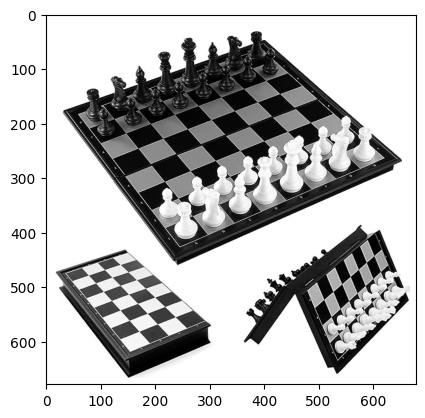

Blurred Image
Edge extraction started
Edges dsiplay:----


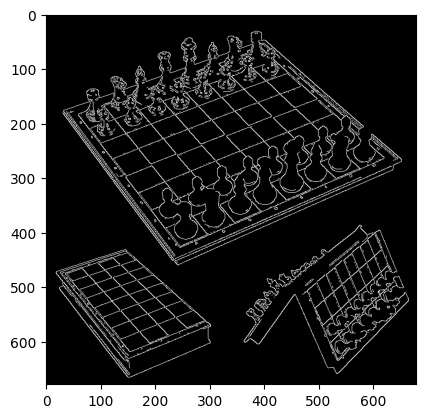

In [139]:
gray_img = gray_imgs[3]
print("Initial Image")
display_img([gray_img])
print("Blurred Image")
blurred = cv2.GaussianBlur(gray_img, (3, 3), 0)
edges = auto_canny(gray_img)
print("Edges dsiplay:----")
display_img([edges])


In [140]:
edges[300]

array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0, 255, 255,   0,   0, 255, 255,   0,   0,   0,   0, 255,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0, 255, 255,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   

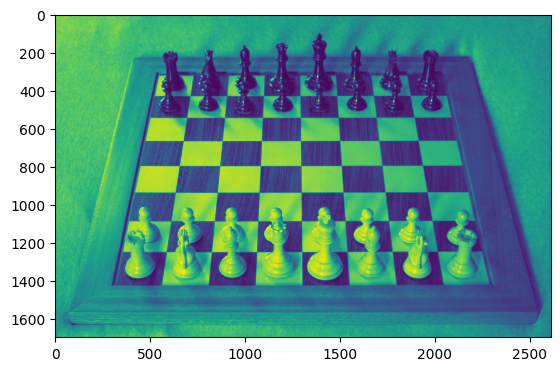

In [141]:
blob_detector=cv2.SimpleBlobDetector_create()
plt.imshow(gray_imgs[4])

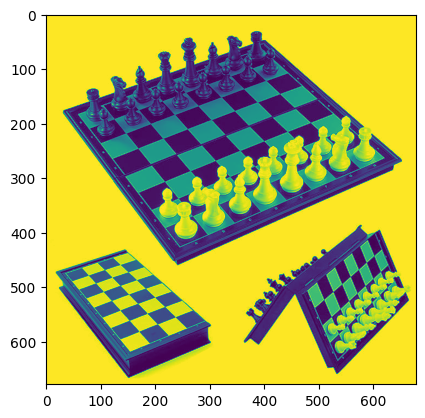

In [142]:
keypoints = blob_detector.detect(image=gray_imgs[3])
blob_test_img = gray_imgs[3].copy()
im_with_keypoints = cv2.drawKeypoints(blob_test_img, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
 
# Show keypoints
plt.imshow(blob_test_img)


In [143]:
im_with_keypoints[1]

array([[255, 255, 255],
       [255, 255, 255],
       [255, 255, 255],
       ...,
       [255, 255, 255],
       [255, 255, 255],
       [255, 255, 255]], dtype=uint8)

In [144]:
lsd = cv2.createLineSegmentDetector()

In [145]:
lines = lsd.detect(gray_imgs[4])

In [146]:
len(lines)
    

4

In [147]:
len(lines[0])

4192

In [148]:
lines[0][1]

array([[ 903.6493, 1267.3407,  885.3975, 1284.23  ]], dtype=float32)

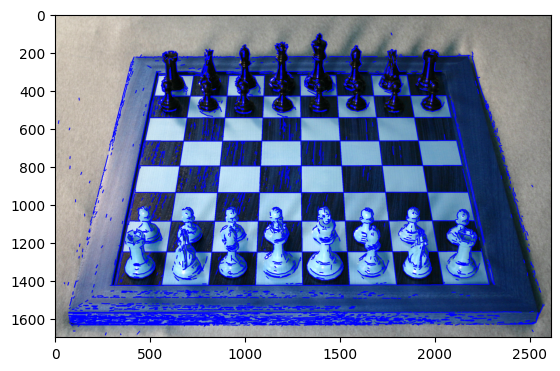

In [149]:
lsd_3_c = imgs[4].copy()
for line in lines[0]:
    x1,y1,x2,y2= line[0]
    p1 = (int(x1),int(y1))
    p2 = (int(x2),int(y2))      
    cv2.line(lsd_3_c, p1, p2, (0, 0, 255), 4)
plt.imshow(lsd_3_c)

In [150]:
def get_euclidean_dist(pnt1:list,pnt2:list):
    temp = np.array(pnt1)- np.array(pnt2)
    distance = np.sqrt(np.dot(temp,temp.T))
    return distance

In [151]:
line_details=[]
for line in lines[0]:
    x1,y1,x2,y2= line[0]
    p1=[x1,y1]
    p2=[x2,y2]
    dist = get_euclidean_dist(p1,p2)
    if (p2[0] - p1[0]) != 0:
        slope = (p2[-1] - p1[-1])/ (p2[0] - p1[0])
    else:
        slope = np.inf
    line_properties = [x1,y1,x2,y2,dist,slope]
    line_details.append(line_properties)


line_details = np.array(line_details)    

In [152]:
len(line_details)

4192

In [153]:
h,w,_ = imgs[4].shape

In [154]:
thresh_h = int(np.floor(h * 0.033))
thresh_w = int(np.floor(w * 0.033))

In [155]:
thresh = np.min([thresh_h,thresh_w])

In [156]:
line_details[1]

array([ 9.0364929e+02,  1.2673407e+03,  8.8539752e+02,  1.2842300e+03,
        2.4867147e+01, -9.2535037e-01], dtype=float32)

(array([3.511e+03, 4.480e+02, 1.000e+02, 5.100e+01, 2.800e+01, 1.900e+01,
        1.700e+01, 1.300e+01, 3.000e+00, 2.000e+00]),
 array([  1.25      ,  31.00076294,  60.75152588,  90.50228882,
        120.25305176, 150.0038147 , 179.75457764, 209.50534058,
        239.25610352, 269.00686646, 298.75762939]),
 <BarContainer object of 10 artists>)

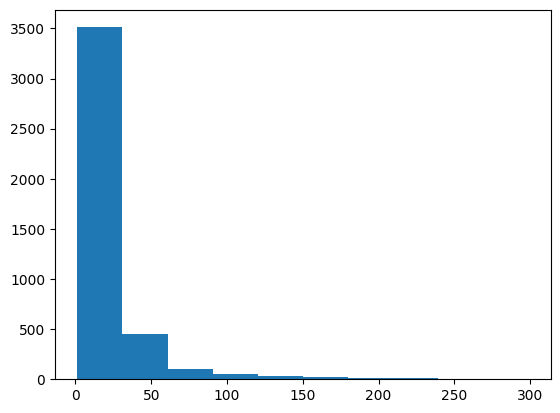

In [157]:
plt.hist(x=line_details[:,4])

In [158]:
indices = np.where(line_details[:,4]>thresh)

In [159]:
indices

(array([  27,   61,   65,   72,   73,   74,   85,   88,   89,   90,   91,
          96,   97,  106,  115,  116,  117,  118,  128,  134,  136,  143,
         147,  151,  159,  168,  171,  172,  173,  178,  190,  191,  192,
         195,  199,  209,  211,  217,  218,  220,  225,  230,  235,  240,
         241,  244,  250,  251,  252,  253,  265,  266,  267,  288,  294,
         296,  305,  308,  310,  312,  314,  318,  324,  327,  330,  334,
         341,  342,  343,  347,  352,  361,  369,  372,  373,  378,  382,
         394,  395,  397,  398,  402,  410,  411,  412,  414,  423,  431,
         436,  443,  446,  452,  453,  454,  459,  461,  463,  471,  474,
         476,  479,  481,  485,  491,  492,  495,  501,  521,  530,  534,
         536,  541,  543,  552,  554,  563,  564,  572,  579,  604,  608,
         613,  629,  638,  639,  651,  656,  661,  669,  675,  677,  680,
         688,  691,  707,  710,  712,  725,  729,  734,  738,  743,  756,
         760,  770,  833,  845,  846, 

In [160]:
set_lines = np.squeeze(lines[0])

In [161]:
set_lines.shape

(4192, 4)

In [162]:
set_lines[indices]

array([[1383.3899 ,  270.64825, 1377.8848 ,  333.3235 ],
       [1641.8745 , 1250.4683 , 1539.3754 , 1250.7667 ],
       [1188.563  ,  274.39136, 1186.0852 ,  340.6889 ],
       ...,
       [2143.3503 ,  681.8267 , 2131.3816 ,  625.9988 ],
       [2130.0474 ,  652.2992 , 2144.4502 ,  714.35754],
       [1233.1866 ,  664.4758 , 1236.4384 ,  581.8578 ]], dtype=float32)

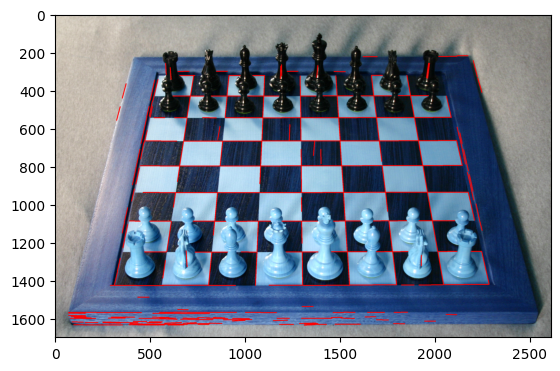

In [163]:
lsd_3_2c = imgs[4].copy()
for line in set_lines[indices]:
    x1,y1,x2,y2= line
    p1 = (int(x1),int(y1))
    p2 = (int(x2),int(y2))      
    cv2.line(lsd_3_2c, p1, p2, (255, 0, 0), 4)
plt.imshow(lsd_3_2c)

In [164]:
line_details[0:5]

array([[ 5.6027338e+02,  4.9113065e+02,  5.5313391e+02,  4.6851682e+02,
         2.3714073e+01,  3.1674404e+00],
       [ 9.0364929e+02,  1.2673407e+03,  8.8539752e+02,  1.2842300e+03,
         2.4867147e+01, -9.2535037e-01],
       [ 9.9547809e+02,  2.2687042e+02,  9.9645197e+02,  1.9557294e+02,
         3.1312634e+01, -3.2137001e+01],
       [ 1.1919120e+03,  4.4572592e+02,  1.1904430e+03,  4.6445874e+02,
         1.8790327e+01, -1.2752140e+01],
       [ 1.1071084e+03,  1.1345117e+03,  1.1014677e+03,  1.1441362e+03,
         1.1155683e+01, -1.7062477e+00]], dtype=float32)

In [165]:
all_slopes = line_details[:,5]

(array([  1.,   2.,   1.,   7.,   4.,   3.,   2.,   3.,   4.,   3.,   1.,
          5.,   2.,   4.,   4.,   1.,   6.,   0.,   2.,   1.,   3.,   3.,
          2.,   2.,   3.,   3.,   3.,   5.,   5.,   2.,   1.,   4.,   4.,
          2.,   3.,   5.,   5.,   3.,   3.,   5.,   2.,   6.,   4.,   3.,
          3.,   2.,   5.,   5.,   5.,   7.,   8.,  10.,   8.,   3.,   3.,
          4.,   9.,   5.,   1.,   6.,   5.,   9.,   8.,   5.,   8.,   6.,
          5.,   7.,   8.,   9.,   8.,  16.,  10.,  13.,  12.,   7.,  11.,
         12.,  13.,  13.,  12.,  12.,  14.,  19.,  19.,  19.,  18.,  19.,
         35.,  15.,  31.,  26.,  31.,  33.,  35.,  41.,  30.,  52.,  49.,
        107., 105.,  55.,  52.,  52.,  40.,  36.,  19.,  21.,  26.,  18.,
         15.,  14.,  17.,  17.,  19.,  18.,  10.,  13.,  13.,  12.,  11.,
          7.,   9.,  12.,   6.,  10.,   9.,   7.,   0.,   6.,  11.,   9.,
         10.,   6.,   4.,   8.,   7.,   8.,   9.,   8.,  12.,   9.,   3.,
          4.,   5.,   4.,   4.,   4., 

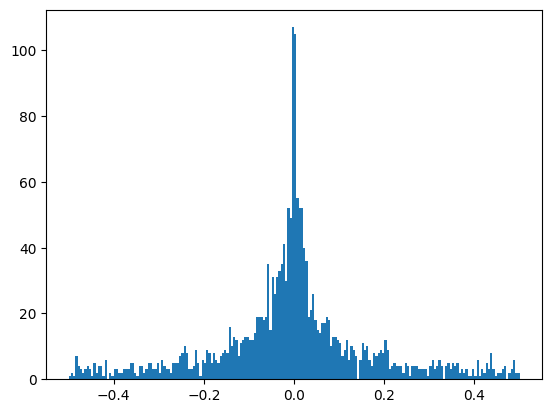

In [166]:
plt.hist(all_slopes,bins=200,range=(-0.5,0.5))

In [224]:
def pipeline(img,gray):
    f3 = np.ones((2,2),np.uint8)
    display_img([gray])
    print("Dilated Images :")
    dialated_img = cv2.dilate(gray,f3,iterations=5)
    display_img([dialated_img])
    # print("Blurred Gray Image :")
    # blurred_gray_img = cv2.GaussianBlur(dialated_img,(5,5),0) 
    # plt.imshow(blurred_gray_img)
    edges = auto_canny(dialated_img,sigma=0.33)
    print("Edges :")
    display_img([edges])
    print("Blurred Edges :")
    blurred_edges = cv2.GaussianBlur(edges,(3,3),0) 
    display_img([blurred_edges])
    # print("Dilated Edges :")
    # dialated_img = cv2.dilate(blurred_edges,f3,iterations=5)
    # display_img([dialated_img])
    # print("Extracted Lines :")
    # kernel = np.ones((2,2),np.uint8)
    # eroded_img = cv2.erode(dialated_img,kernel,iterations = 5)
    # print("Eroded image :")
    # display_img([eroded_img])
    img_w_line = extract_lines(blurred_edges,img)
    plt.imshow(img_w_line)
    plt.show()

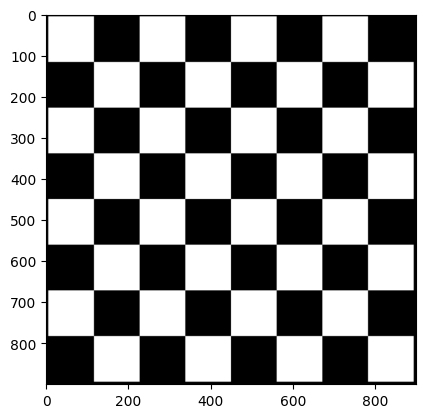

Dilated Images :


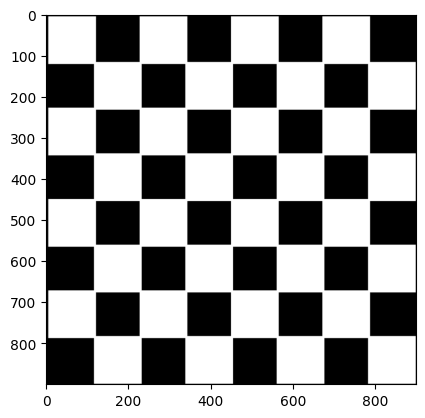

Edge extraction started
Edges :


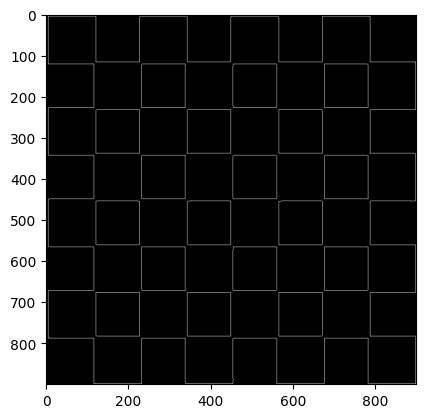

Blurred Edges :


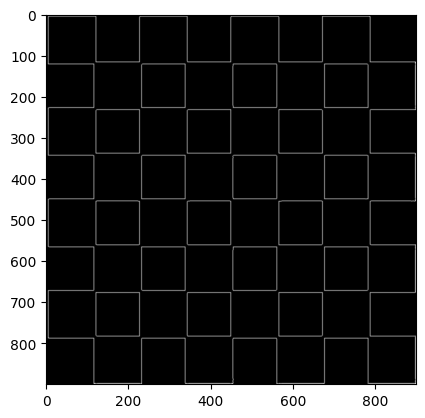

Line proposal started
Extraction of line properties started
(2, 248) (2, 248)
[107.500496 107.500496 107.500755 107.500755 107.500626 107.500626
 107.50472  107.506584 111.25043  111.25006  115.00095  106.251564
 101.25009  112.500626 106.25053  101.25009  112.5      115.0008
 115.0008   107.500114 107.500114 107.50006  107.50006  105.00482
 103.75012  103.75009  103.75012  103.75009  103.7504   105.00004
 105.00072  105.00074  103.750046 105.00072  105.       103.75006
 105.00072  105.00074  105.00074  103.75     107.500305 102.501015
 102.501015 102.5008   107.500305 102.5008   106.25     105.00018
 106.25     103.750435 103.75015  102.500854 105.00015  103.75015
 103.75018  105.00018  103.750435 103.75018  102.500854 106.25
 105.00015  106.25     108.750046 103.75015  107.5001   103.75015
 107.50014  106.25012  107.50014  106.25012  100.00021  101.25
 101.25     107.50135  107.50135  105.000244 105.00071  107.500435
 103.75012  105.00071  107.500435 103.75006  105.00071  105.00071
 

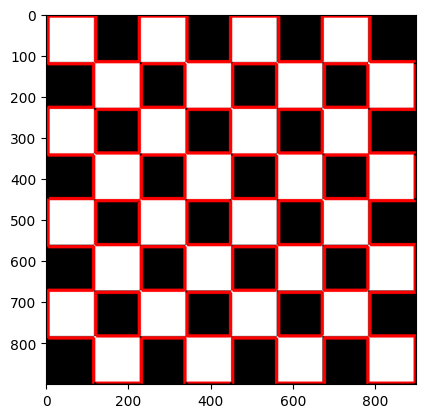

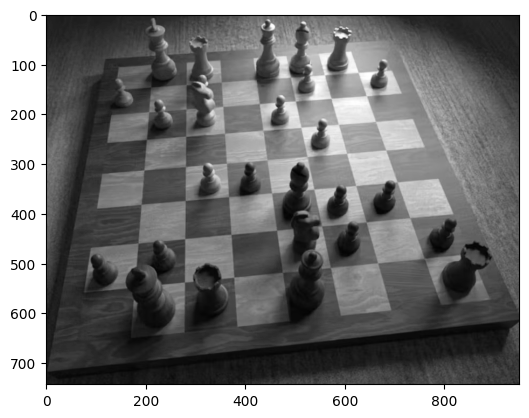

Dilated Images :


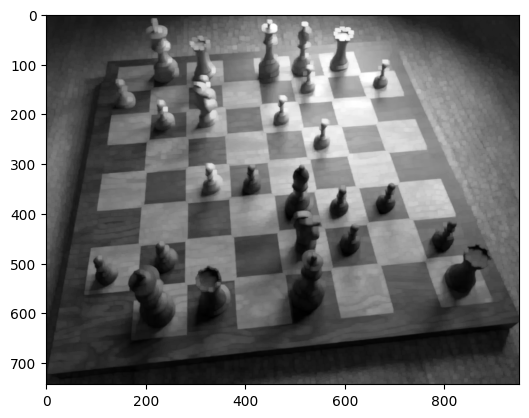

Edge extraction started
Edges :


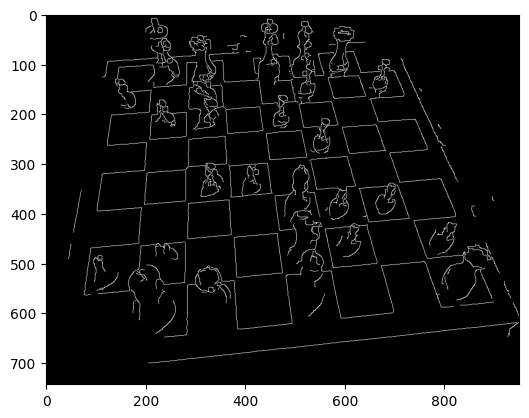

Blurred Edges :


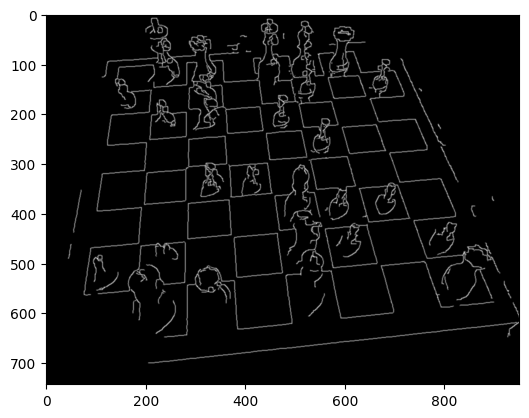

Line proposal started
Extraction of line properties started
(2, 999) (2, 999)
[  6.639937    9.735921   10.468047  172.2505     92.07533    12.677582
  15.884418   24.99832    56.16786     7.574506   35.02217     9.759773
  12.262083   24.898582   20.940258    8.214796   13.795472   12.400354
   7.5934215  13.333339   10.69143    20.182737    8.9811325  50.61769
   7.773074   11.513314   17.78591     7.594864   11.407221   25.028864
  31.47019    11.236613   17.35174    11.169612   14.996224   11.523798
  19.517355    9.950761   14.251076   20.459042   20.780891   18.733295
  34.67183    40.701233   43.501663    9.762465   40.6818     11.4971895
   8.99529    16.257658   10.297774   21.503628   13.281707   30.73948
  22.247639   18.573082   19.412994   18.746986    9.758551    9.746649
  29.456404   23.8738     14.23921    15.812639   37.78783    19.764013
   9.993292   13.458688   32.200577    3.8602114  19.760202    9.910609
   7.8365035   9.504344   15.096451   24.24876     7.271345

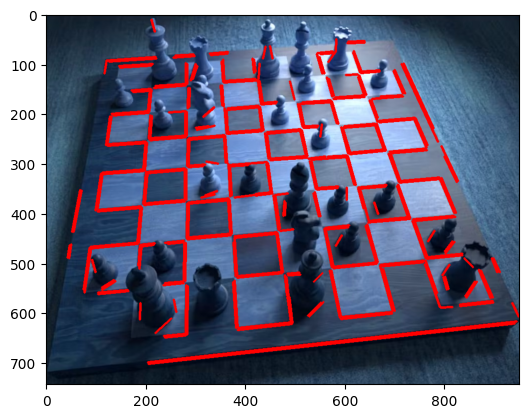

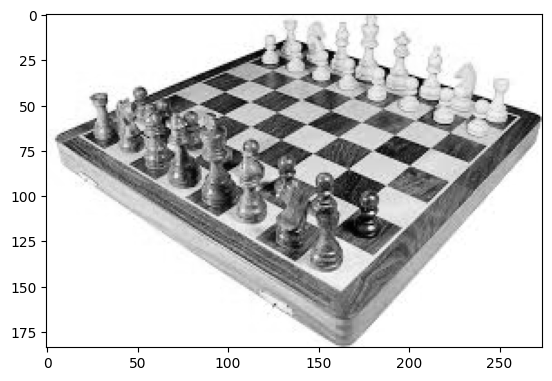

Dilated Images :


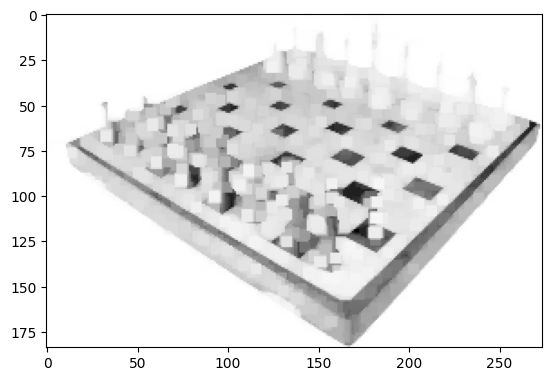

Edge extraction started
Edges :


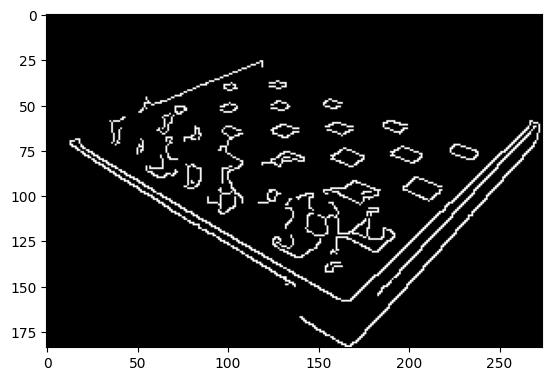

Blurred Edges :


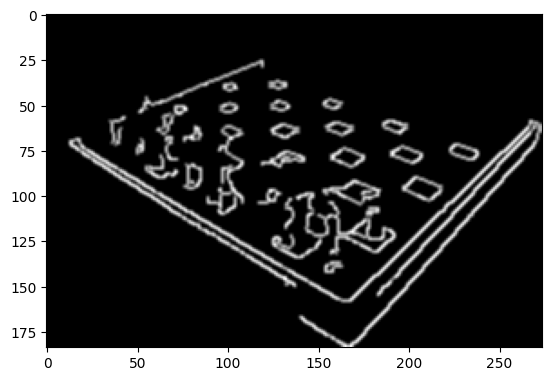

Line proposal started
Extraction of line properties started
(2, 124) (2, 124)
[ 14.251489    5.1321874   7.1127205 109.160225   29.417149  122.93923
 137.02687   151.35312   150.42575    14.233726   53.16332    66.88665
   9.003257    9.821467   96.33535    10.747809    7.9971523   9.754108
  98.16393    35.01305     8.374267    9.013849   15.661995    5.585845
  71.811844   26.788235  116.66849     6.7154193   7.767323    6.1600566
   7.745922   11.953643   17.892836    6.2200475  10.643305   20.137428
  10.747008    7.284732    9.519676   15.07971    13.171506   14.016214
  10.077212   17.931328    7.282082    5.1820717   6.3406944  15.253867
   7.0595984   6.3339014   8.769437   13.040474   10.739992    6.087
  11.785388    9.013712    6.1887345   7.254627    7.2728596  11.668288
  63.835144   12.644021   15.744658   45.276478   12.305543   15.150799
   9.491883    7.4429736   9.999288    6.3689456   8.7805805  40.304684
   7.603408   12.62534    12.844407    7.4999957  16.229977   

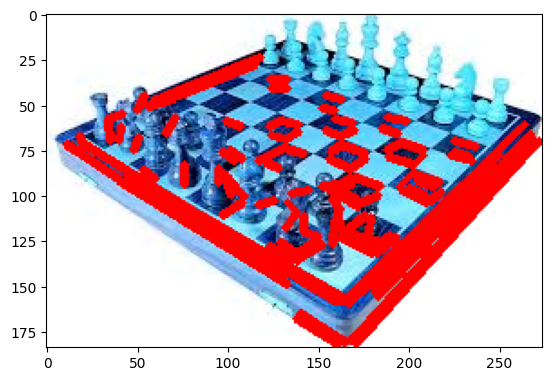

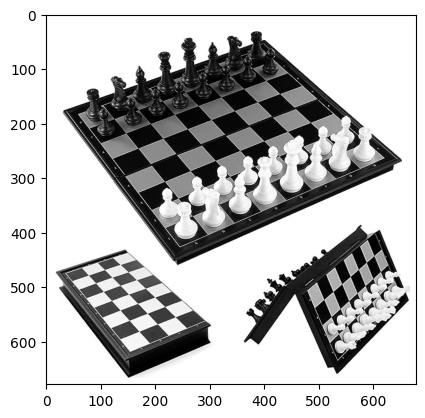

Dilated Images :


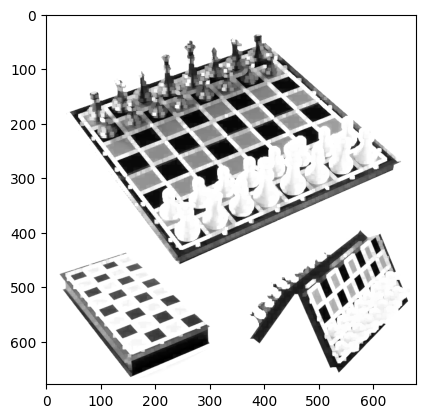

Edge extraction started
Edges :


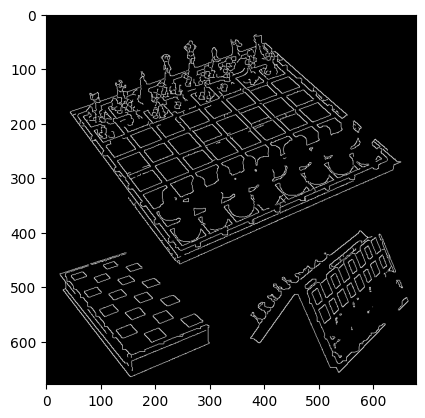

Blurred Edges :


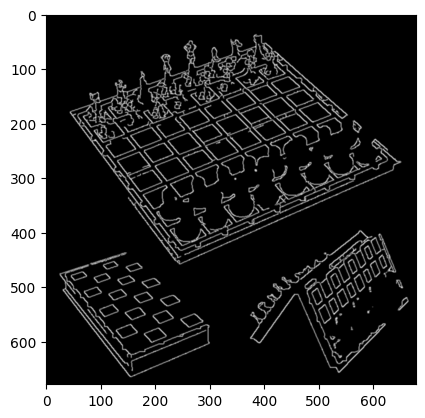

Line proposal started
Extraction of line properties started
(2, 1167) (2, 1167)
[15.051942  12.373068  20.036175  ... 11.4084215 10.07324    8.381515 ]
[-11.647648    -0.97061855 -12.584991   ...  -0.37718603  -0.5319685
  -0.46313825]
lines_prop6 shape : (6, 542)
Length of line segments ===== 542, shape (542, 4)
Number of lines extracted542


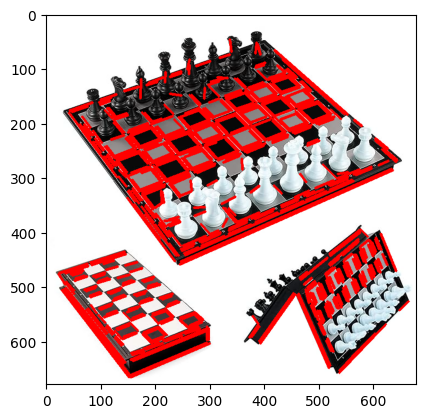

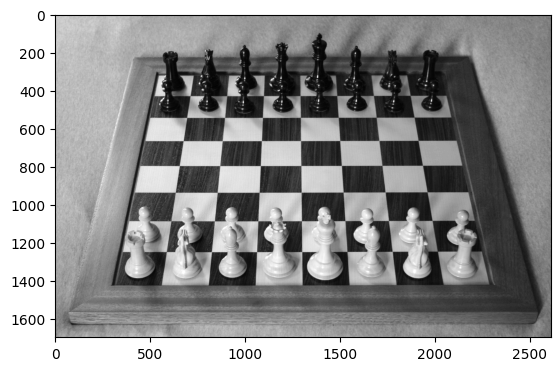

Dilated Images :


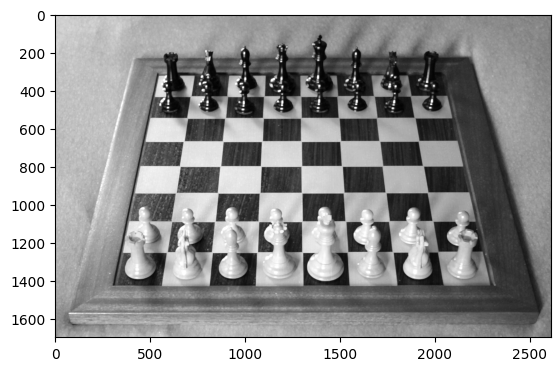

Edge extraction started
Edges :


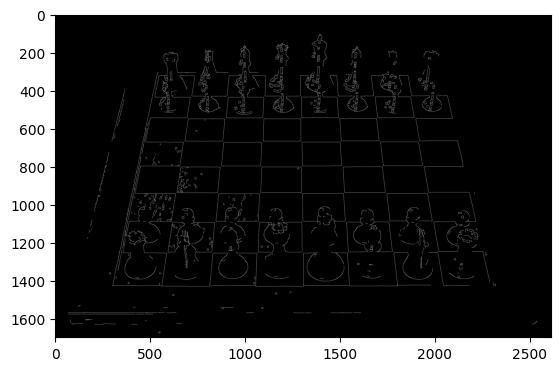

Blurred Edges :


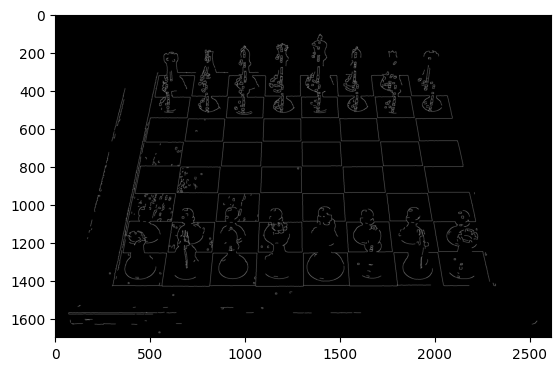

Line proposal started
Extraction of line properties started
(2, 2169) (2, 2169)
[20.149698 16.386574 22.603268 ...  8.363044  8.728028 11.377641]
[ -9.956353     0.07128881 -18.204731   ...  -2.4265246   -3.2278228
  -0.05896941]
lines_prop6 shape : (6, 292)
Length of line segments ===== 292, shape (292, 4)
Number of lines extracted292


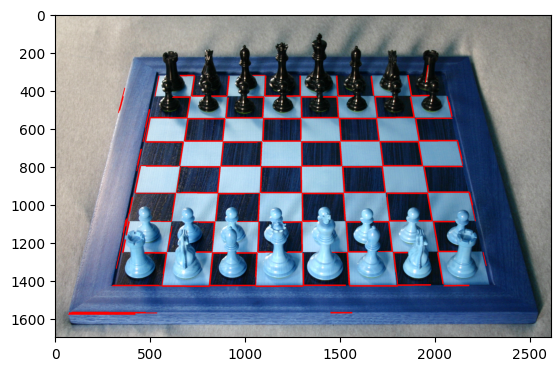

In [225]:
for i,img in enumerate(imgs):
    lsd_img = img
    lsd_gray = gray_imgs[i]
    pipeline(lsd_img,lsd_gray)